# Assignment 1/B
**Disclaimer: Only for ADL/AML students!**

### General information
**You have to solve all tasks to pass!** 

Grade is calculated by the day of the last submission, but you will only get it after you've succesfully presented it. 

**Deadlines and grades:** 
  * 2020.09.20 - 2020.10.20 ==> 5
  * 2020.10.21 - 2020.10.27 ==> 4
  * 2020.10.28 - 2020.11.03 ==> 3
  * 2020.11.04 - 2020.11.10 ==> 2
  * 2020.11.11 or later ==> 1  

You can **use only these** 3rd party **packages:** `cv2, keras, matplotlib, numpy, pandas, sklearn, skimage, tensorflow`.

### Description
In this assignment you have to build and train a cat eyes and nose keypoint detector model using tf.keras. We will use an autoencoder like architecture, which first encodes the data, then decodes it to its original size. To implement such kind of models, you should take a look at the following classes and methods: `Funcitonal API, MaxPooling2D, Conv2DTranspose`.


## Prepare dataset

* Download the Cats dataset. We will only use a subset of the original dataset, the CAT_00 folder. Here you can find more information about the dataset: https://www.kaggle.com/crawford/cat-dataset
* Preprocess the data. You can find some help here: https://github.com/kairess/cat_hipsterizer/blob/master/preprocess.py
  * Following the steps in the link above, read and resize the images to be 128x128.
  * Keep only the left eye, right eye and mouth coordinates.
  * Create a keypoint heatmap from the keypoints. A 128x128x3 channel image, where the first channel corresponds to left eye heatmap, the sencond channel corresponds to the right eye heatmap and the third channel corresponds to the mouth heatmap. To do this:
    1. At each keypoint, draw a circle with its corresponding color. For this, use the following method: `cv2.circle(<heatmap>, center=<keypoint_coord>, radius=2, color=<keypoint_color>, thickness=2)`
    2. Then smooth the heatmap with a 5x5 Gauss filter: `<heatmap> = cv2.GaussianBlur(<heatmap>, (5,5), 0)` 
  * Then crop each image and heatmap:
    1. Define the bounding box, select the min and max keypoint coordinates: `x1, y1, x2, y2`.
    2. Add a 20x20 border around it: `x1, y1, x2, y2 = x1-20, y1-20, x2+20, y2+20`.
    3. Then crop the image and the heatmap using the extended bounding box.  
  * Finally, resize the images and the heatmaps to be 64x64.
* Split the datasets into train-val-test sets (ratio: 60-20-20), without shuffling.
* Print the size of each set and plot 5 training images and their corresponding masks.
* Normalize the datasets. All value should be between 0.0 and 1.0. *Note: you don't have to use standardization, you can just divide them by 255.*

In [ ]:
!curl -c ./cookie -s -L "https://drive.google.com/uc?export=download&id=1wGwNi8t-UKAKs-LQL3dG-D8dzGVPHv2w" > /dev/null
!curl -Lb ./cookie "https://drive.google.com/uc?export=download&confirm=`awk '/download/ {print $NF}' ./cookie`&id=1wGwNi8t-UKAKs-LQL3dG-D8dzGVPHv2w" -o CAT_00.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   408    0   408    0     0   5100      0 --:--:-- --:--:-- --:--:--  5100
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100  402M    0  402M    0     0  73.4M      0 --:--:--  0:00:05 --:--:-- 85.9M


In [ ]:
!unzip CAT_00.zip

Archive:  CAT_00.zip
   creating: CAT_00/
 extracting: CAT_00/00000001_000.jpg  
  inflating: CAT_00/00000001_000.jpg.cat  
 extracting: CAT_00/00000001_005.jpg  
  inflating: CAT_00/00000001_005.jpg.cat  
 extracting: CAT_00/00000001_008.jpg  
  inflating: CAT_00/00000001_008.jpg.cat  
 extracting: CAT_00/00000001_011.jpg  
  inflating: CAT_00/00000001_011.jpg.cat  
 extracting: CAT_00/00000001_012.jpg  
  inflating: CAT_00/00000001_012.jpg.cat  
 extracting: CAT_00/00000001_016.jpg  
  inflating: CAT_00/00000001_016.jpg.cat  
 extracting: CAT_00/00000001_017.jpg  
  inflating: CAT_00/00000001_017.jpg.cat  
 extracting: CAT_00/00000001_020.jpg  
  inflating: CAT_00/00000001_020.jpg.cat  
  inflating: CAT_00/00000001_024.jpg  
  inflating: CAT_00/00000001_024.jpg.cat  
  inflating: CAT_00/00000001_027.jpg  
  inflating: CAT_00/00000001_027.jpg.cat  
 extracting: CAT_00/00000001_029.jpg  
  inflating: CAT_00/00000001_029.jpg.cat  
 extracting: CAT_00/00000002_001.jpg  
  inflating: CAT_

In [ ]:
import os
import glob
import numpy as np
import matplotlib.pyplot as plt
import PIL
import PIL.ImageDraw
import glob as gb
import cv2 

In [ ]:
import tensorflow as tf
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()
gpu_options = tf.GPUOptions(allow_growth=True)  # init TF ...
config=tf.ConfigProto(gpu_options=gpu_options)  # w/o taking ...
with tf.Session(config=config): pass            # all GPU memory

Instructions for updating:
non-resource variables are not supported in the long term


In [ ]:
dataset_location = '/content/CAT_00'

In [ ]:
dataset = '/content/'

In [ ]:
folders_all = ['CAT_00']

In [ ]:
dirname = 'CAT_00'

In [ ]:
for folder in  os.listdir(dataset_location) : 
    files = gb.glob(pathname= str(dataset_location   + '/*.jpg'))
print(f'For training data , found {len(files)} ')
print(files)

For training data , found 1706 
['/content/CAT_00/00000078_011.jpg', '/content/CAT_00/00000384_006.jpg', '/content/CAT_00/00000043_020.jpg', '/content/CAT_00/00000322_021.jpg', '/content/CAT_00/00000017_005.jpg', '/content/CAT_00/00000068_001.jpg', '/content/CAT_00/00000095_024.jpg', '/content/CAT_00/00000364_022.jpg', '/content/CAT_00/00000303_013.jpg', '/content/CAT_00/00000398_019.jpg', '/content/CAT_00/00000037_006.jpg', '/content/CAT_00/00000350_005.jpg', '/content/CAT_00/00000093_009.jpg', '/content/CAT_00/00000324_017.jpg', '/content/CAT_00/00000078_018.jpg', '/content/CAT_00/00000064_000.jpg', '/content/CAT_00/00000085_020.jpg', '/content/CAT_00/00000428_013.jpg', '/content/CAT_00/00000034_001.jpg', '/content/CAT_00/00000399_029.jpg', '/content/CAT_00/00000414_006.jpg', '/content/CAT_00/00000075_027.jpg', '/content/CAT_00/00000441_013.jpg', '/content/CAT_00/00000060_005.jpg', '/content/CAT_00/00000009_015.jpg', '/content/CAT_00/00000450_019.jpg', '/content/CAT_00/00000026_024.j

In [ ]:
def build_image_files_list(folders):
    image_files_list = []
    for folder in folders:
        wild_path = os.path.join(dataset, folder, '*.jpg')
    return wild_path

In [ ]:
image_paths_all = build_image_files_list(folders_all)


In [ ]:
print(image_paths_all)

/content/CAT_00/*.jpg


# Preprocess The Data

## Create a keypoint heatmap

In [ ]:
def load_keypoints(path):    
    """Load keypoints from .cat file
    
    The .cat file is a single-line text file in format: 'nb_keypoints x1, y1, x2, y2, ...'
    """
    with open(path, 'r') as f:
        line = f.read().split()  # [nb_keypoints, x1, y1, x2, y2, ...]
    keypoints_nb = int(line[0])  # int
    keypoints_1d = np.array(line[1:], dtype=int)  # np.ndarray, [x1, y1, x2, y2, ...]
    keypoints_xy = keypoints_1d.reshape((-1, 2))  # np.ndarray, [[x1, y1], [x2, y2], ...]
    assert keypoints_nb == len(keypoints_xy)
    assert keypoints_nb == 9           # always nine keypoints, eyes, nose, two ears
    return keypoints_xy                     # np.ndarray, [[x1, y1], [x2, y2], ...]

In [ ]:
def draw_keypoints(img, keypoints, r=4, c='blue'):
    """Draw keypoints on PIL image"""
    draw = PIL.ImageDraw.Draw(img)
    i = 0
    for x, y in keypoints:
      if i != 3:
        draw.ellipse([x-r, y-r, x+r, y+r], c)
        i = i + 1
    return img

In [ ]:
def load_image_keypoints(image_path, keypoints_path, target_size):
    image = PIL.Image.open(image_path)
    keypoints = load_keypoints(keypoints_path)
    image_new, keypoints_new = scale_img_kps(image, keypoints, target_size)
    return image, keypoints, image_new, keypoints_new

In [ ]:
def plot_images(indices, images, keypoints):
    """Plot bunch of images with keypoint overlay
    
    Params:
        indices - indices of images to plot, e.g. [0, 10, 20, ...]
        images - np.ndarray with raw images, [batch_size, width, height, channel]
        keypoints - np.ndarray with keypoints, [batch_size, num_keypoints, x, y]
    """
    _, axes = plt.subplots(nrows=1, ncols=len(indices), figsize=[12,4])
    if len(indices) == 1: axes = [axes]

    for i, idx in enumerate(indices):
        img = PIL.Image.fromarray(images[idx])
        kps = keypoints[idx]
        axes[i].imshow(draw_keypoints(img, kps))
        axes[i].axis('off')
    
    plt.show()

In [ ]:
def scale_img_kps(image, keypoints, target_size):
    width, height = image.size
    ratio_w = width / target_size
    ratio_h = height / target_size
    
    image_new = image.resize((target_size, target_size), resample=PIL.Image.LANCZOS)
    
    keypoints_new = np.zeros_like(keypoints)
    keypoints_new[range(len(keypoints_new)), 0] = keypoints[:,0] / ratio_w
    keypoints_new[range(len(keypoints_new)), 1] = keypoints[:,1] / ratio_h
    
    return image_new, keypoints_new

In [ ]:
print('Nb images:', len(files))
files[:3]

Nb images: 1706


['/content/CAT_00/00000078_011.jpg',
 '/content/CAT_00/00000384_006.jpg',
 '/content/CAT_00/00000043_020.jpg']

In [ ]:
example_path = files[0]
print(image_paths_all)
img = PIL.Image.open(example_path)
kps = load_keypoints(example_path+'.cat')

/content/CAT_00/*.jpg


In [ ]:
display(kps)


array([[536, 341],
       [630, 337],
       [583, 406],
       [475, 277],
       [447, 190],
       [533, 239],
       [621, 235],
       [708, 173],
       [699, 266]])

In [ ]:
s = 128
X_Image = []
files = gb.glob(str( dataset_location + '/*.jpg'))
for file in files: 
        image = cv2.imread(file)
        image_array = cv2.resize(image , (s,s))
        X_Image.append(list(image_array))

In [ ]:
print(f'We have {len(X_Image)} items in X_train')

We have 1706 items in X_train


In [ ]:
KeyPointsImg = []
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_Image),1706))) : 
    image, keypoints, image_new, keypoints_new = load_image_keypoints(
    files[i], files[i]+'.cat', target_size=128)
    #display(draw_keypoints(image.copy(), keypoints))
    #display(draw_keypoints(image_new.copy(), keypoints_new))
    KeyPointsImg.append(draw_keypoints(image_new.copy(), keypoints_new))

<Figure size 1440x1440 with 0 Axes>

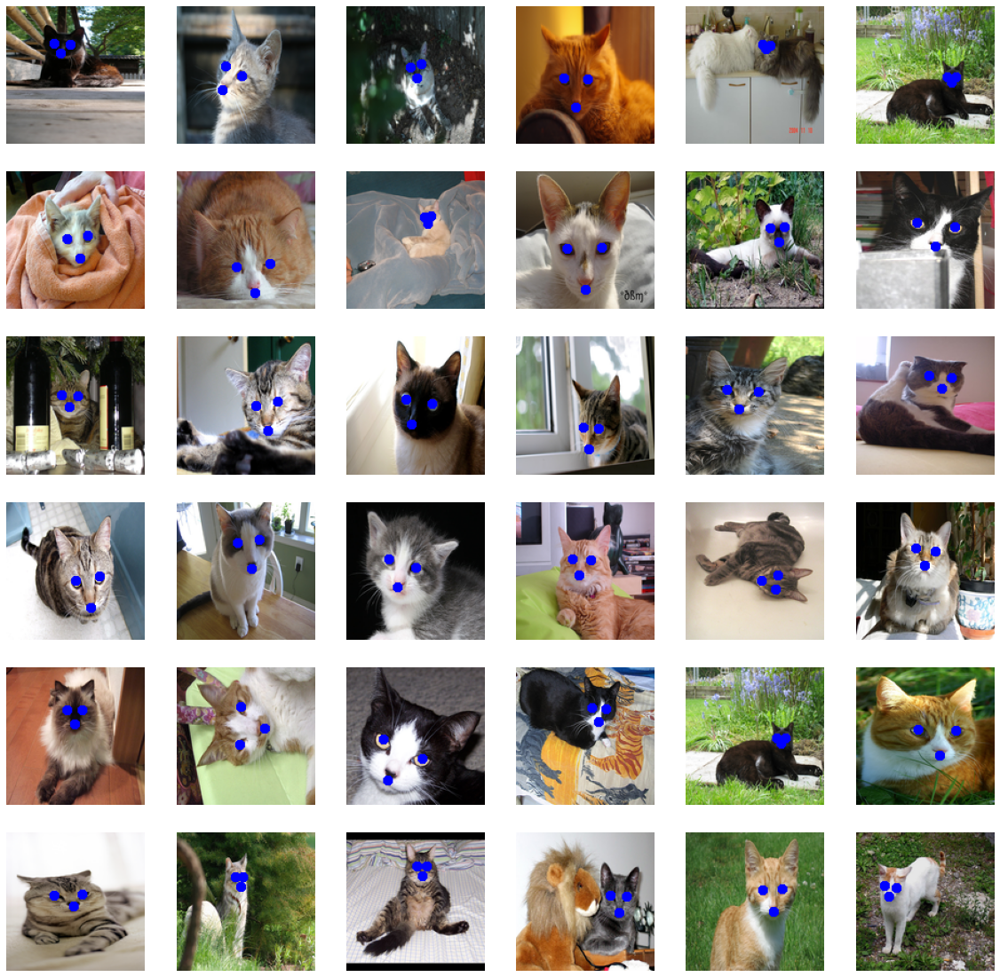

In [ ]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(KeyPointsImg),36))) : 
#for i in range(0, len(KeyPointsImg)):
    plt.subplot(6,6,n+1)
    plt.imshow(KeyPointsImg[i])   
    plt.axis('off')
    #plt.title(getcode(y_train[i]))

# Apply Gausian Filter

In [ ]:
GausianBlurImg = []
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(KeyPointsImg),1706))) : 
    firstImg = np.asarray(KeyPointsImg[i])
    #gray=cv2.cvtColor(firstImg,cv2.COLOR_BGR2GRAY)
    image = cv2.GaussianBlur(firstImg, (5,5), 0)
    GausianBlurImg.append(image)

<Figure size 1440x1440 with 0 Axes>

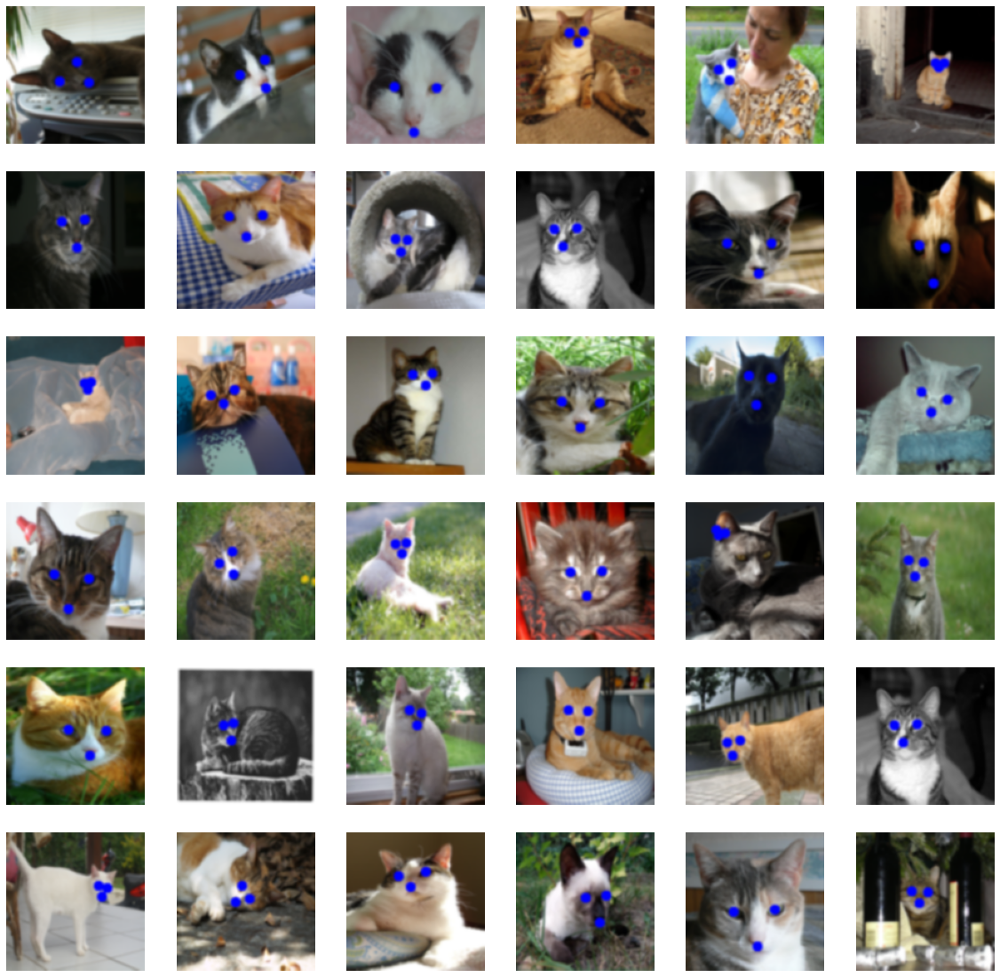

In [ ]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(GausianBlurImg),36))) : 
#for i in range(0, len(KeyPointsImg)):
    plt.subplot(6,6,n+1)
    plt.imshow(GausianBlurImg[i])   
    plt.axis('off')
    #plt.title(getcode(y_train[i]))

# Cropping Image And Heatmap

## Crop Heatmap

In [ ]:
CropHeatMapImg = []
for n , i in enumerate(list(np.random.randint(0,len(GausianBlurImg),1706))) : 
    firstImg = np.asarray(GausianBlurImg[i])
    height, width = firstImg.shape[0:2]
    startRow = int(height*.15)
    startCol = int(width*.15)
    endRow = int(height*.85)
    endCol = int(width*.85)
    croppedImage = firstImg[startRow:endRow, startCol:endCol]
    CropHeatMapImg.append(croppedImage)

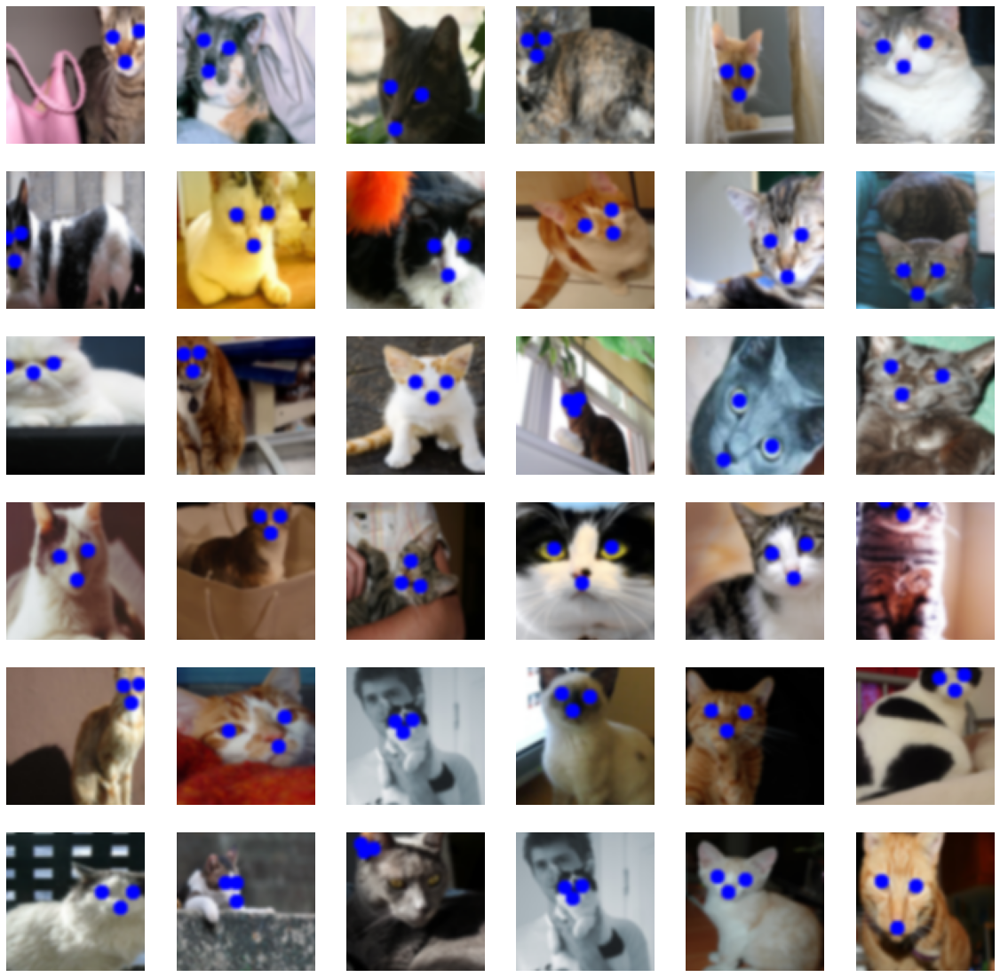

In [ ]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(CropHeatMapImg),36))) : 
#for i in range(0, len(CropImg)):
    plt.subplot(6,6,n+1)
    plt.imshow(CropHeatMapImg[i])   
    plt.axis('off')
    #plt.title(getcode(y_train[i]))

## Crop Image

In [ ]:
CropImg = []
for n , i in enumerate(list(np.random.randint(0,len(X_Image),1706))) : 
    firstImg = np.asarray(X_Image[i])
    height, width = firstImg.shape[0:2]
    startRow = int(height*.15)
    startCol = int(width*.15)
    endRow = int(height*.85)
    endCol = int(width*.85)
    croppedImage = firstImg[startRow:endRow, startCol:endCol]    
    CropImg.append(croppedImage)

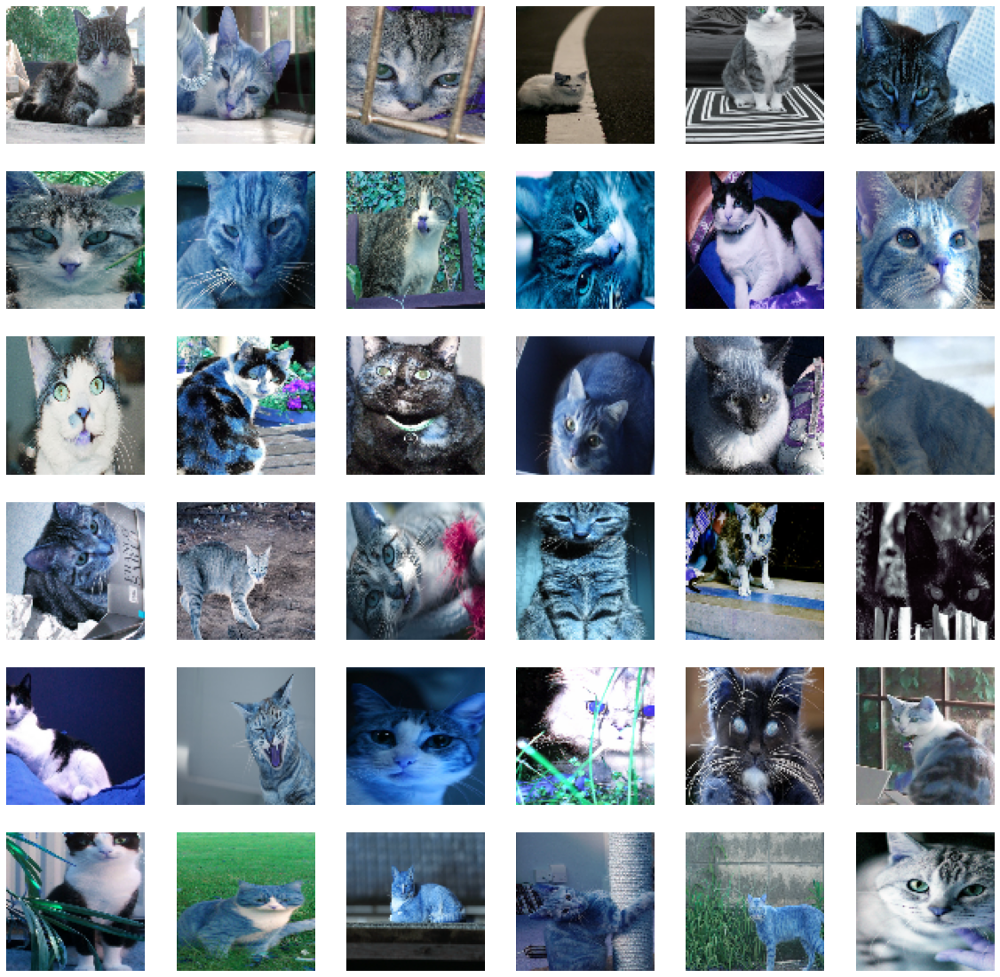

In [ ]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(CropImg),36))) : 
#for i in range(0, len(CropImg)):
    plt.subplot(6,6,n+1)
    plt.imshow(CropImg[i])   
    plt.axis('off')
    #plt.title(getcode(y_train[i]))

# Resize Image and Heatmap

## Resize Heatmap

In [ ]:
ResizeHeatmap = []
for n , i in enumerate(list(np.random.randint(0,len(CropHeatMapImg),1706))) : 
    Img = np.asarray(CropHeatMapImg[i])
    newImg = cv2.resize(Img,(64,64))
    ResizeHeatmap.append(newImg)

## Resize Image

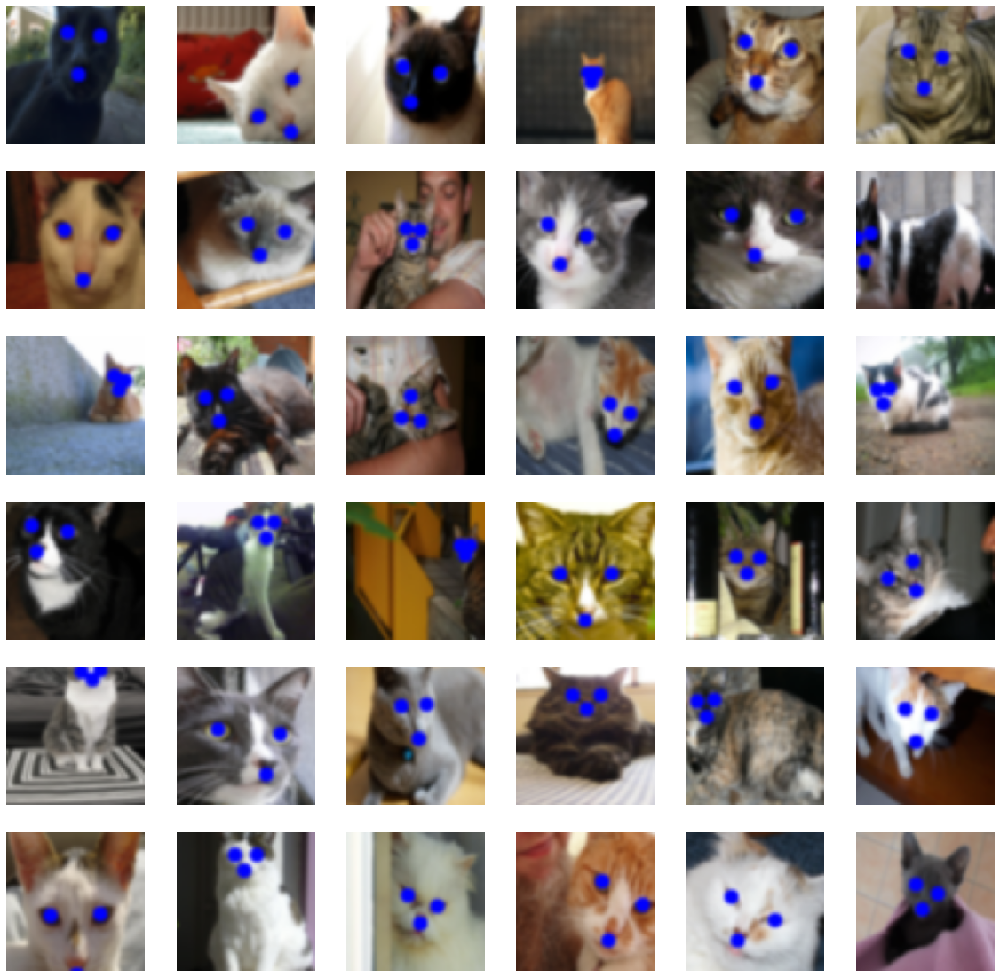

In [ ]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(ResizeHeatmap),36))) : 
#for i in range(0, len(KeyPointsImg)):
    plt.subplot(6,6,n+1)
    plt.imshow(ResizeHeatmap[i])   
    plt.axis('off')
    #plt.title(getcode(y_train[i]))

In [ ]:
ResizeImage = []
for n , i in enumerate(list(np.random.randint(0,len(CropImg),1706))) : 
    Img = np.asarray(CropImg[i])
    newImg = cv2.resize(Img,(64,64))
    ResizeImage.append(newImg)

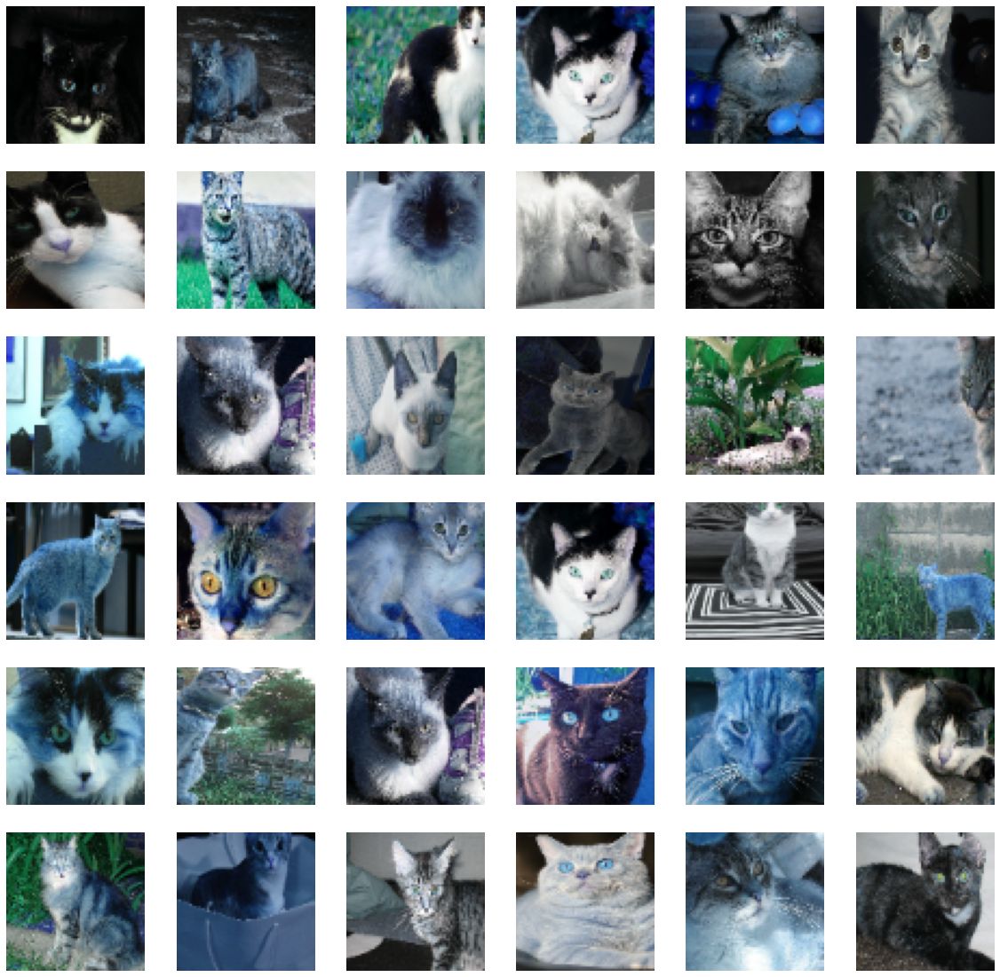

In [ ]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(ResizeImage),36))) : 
#for i in range(0, len(KeyPointsImg)):
    plt.subplot(6,6,n+1)
    plt.imshow(ResizeImage[i])   
    plt.axis('off')
    #plt.title(getcode(y_train[i]))

# Splitting The Dataset

In [ ]:
trainsplit = 900
testvalsplit = 403
X_train =np.array(ResizeImage[trainsplit:]) 
y_train =np.array(ResizeHeatmap[trainsplit:]) 
X_test =np.array(ResizeImage[:testvalsplit]) 
y_test =np.array(ResizeHeatmap[:testvalsplit]) 
X_val =np.array(ResizeImage[:testvalsplit])
y_val =np.array(ResizeHeatmap[:testvalsplit]) 


print(f'For training data , found {len(X_train)} ')
print(f'For training data , found {len(y_train)} ')
print(f'For testing data , found {len(X_test)} ')
print(f'For testing data , found {len(y_test)} ')
print(f'For validation data , found {len(X_val)} ')
print(f'For validation data , found {len(y_val)} ')



For training data , found 806 
For training data , found 806 
For testing data , found 403 
For testing data , found 403 
For validation data , found 403 
For validation data , found 403 


# Data Normalization




In [ ]:
X_train = X_train/.255
y_train = y_train/.255
X_test = X_test/.255
y_test = y_test/.255
X_val = X_val/.255
y_val = y_val/.255

## Data augmentation
  * Augment the training set using `ImageDataGenerator`. The parameters should be the following: `featurewise_center=False, featurewise_std_normalization=False, width_shift_range=0.1, height_shift_range=0.1, zoom_range=0.2`.
  * When creating the generator(s), use shuffling with a seed value of 1 and batch size of 32.
  * To validate that the augmentation is working, plot 5 original images with their corresponding transformed (augmented) images and masks.

**Keep in mind:** To augment the inputs and targets the same way, you should create 2 separate generator, then you can zip them together. 


In [ ]:
from keras.preprocessing.image import ImageDataGenerator
datagen = ImageDataGenerator(
        featurewise_center=False,  # set input mean to 0 over the dataset
        samplewise_center=False,  # set each sample mean to 0
        featurewise_std_normalization=False,  # divide inputs by std of the dataset
        samplewise_std_normalization=False,  # divide each input by its std
        zca_whitening=False,  # apply ZCA whitening
        rotation_range=10,  # randomly rotate images in the range (degrees, 0 to 180)
        zoom_range = 0.2, # Randomly zoom image 
        width_shift_range=0.1,  # randomly shift images horizontally (fraction of total width)
        height_shift_range=0.1,  # randomly shift images vertically (fraction of total height)
        horizontal_flip=False,  # randomly flip images
        vertical_flip=False)  # randomly flip images


datagen.fit(X_train)

## Define the model
Define the following architecture in tf.keras:
```
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
=================================================================
input_1 (InputLayer)         [(None, 64, 64, 3)]       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 64, 64, 64)        1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 64, 64, 64)        36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 32, 32, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 32, 32, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 32, 32, 128)       147584    
_________________________________________________________________
bottleneck_1 (Conv2D)        (None, 32, 32, 160)       5243040   
_________________________________________________________________
bottleneck_2 (Conv2D)        (None, 32, 32, 160)       25760     
_________________________________________________________________
upsample_1 (Conv2DTranspose) (None, 64, 64, 3)         1920      
=================================================================
Total params: 5,530,880
Trainable params: 5,530,880
Non-trainable params: 0
_________________________________________________________________
```
* Use relu and `padding='same'` for each layer.
* Use a 2x2 `Conv2DTranspose` layer without bias to upsample the result. 
* `block1_conv1`, `block1_conv2`, `block2_conv1` and `block2_conv2` are 3x3 convolutions.
* `bottleneck_1` is a 16x16 and `bottleneck_2` is a 1x1 convolution.
* For optimizer use RMSProp, and MSE as loss function.


In [ ]:
%tensorflow_version 2.x
import tensorflow as tf
from tensorflow.keras.models import *
from tensorflow.keras.layers import *
from tensorflow.keras.callbacks import *

In [ ]:
def fcnet(input_size=(64, 64, 3)):
  model = tf.keras.Sequential()
  model.add(Conv2D(64, kernel_size=3,padding='same', activation='relu', input_shape=input_size))
  model.add(Conv2D(64, kernel_size=3, padding='same',activation='relu'))
  model.add(MaxPooling2D(pool_size=2))
  model.add(Conv2D(128, kernel_size=3,padding='same', activation='relu'))
  model.add(Conv2D(128, kernel_size=3,padding='same', activation='relu'))
  model.add(Conv2D(160, kernel_size=16,padding='same', activation='relu'))
  model.add(Conv2D(160, kernel_size=1,padding='same', activation='relu'))
  model.add(Conv2DTranspose(3,kernel_size=2,strides=(2,2),padding='same', activation='relu',use_bias=False))
  return model

model = fcnet(input_size=(64, 64, 3))
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 64, 64, 64)        1792      
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 64, 64, 64)        36928     
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 32, 32, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 32, 32, 128)       73856     
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 32, 32, 128)       147584    
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 32, 32, 160)       5243040   
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 32, 32, 160)       2

In [ ]:
# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae', 'acc'])


## Training and evaluation 
  * Train the model for 30 epochs without early stopping.
  * Plot the training curve (train/validation loss).
  * Evaluate the trained model on the test set.
  * Plot some (5) predictions with their corresponding GT heatmap and input. You should mark the location of each keypoint on the image. *Note: it might be worth to take a look at this answer: https://stackoverflow.com/a/17386204*

In [ ]:
Batch_size = 64
seed=10
#model.fit(datagen.flow(X_train,batch_size=Batch_size), epochs=Epochs)
generator = datagen.flow(X_train,y_train,batch_size=Batch_size, shuffle=False, seed=seed)


In [ ]:
history = model.fit(generator, epochs=30, validation_data=(X_test,y_test))

Epoch 1/30
13/13 [==============================] - ETA: 0s - batch: 6.0000 - size: 62.0000 - loss: 229947.7127 - mean_absolute_error: 381.3674 - acc: 0.3778WARNING:tensorflow:From /usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training_v1.py:2048: Model.state_updates (from tensorflow.python.keras.engine.training) is deprecated and will be removed in a future version.
Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
13/13 [==============================] - 4s 294ms/step - batch: 6.0000 - size: 62.0000 - loss: 229947.7127 - mean_absolute_error: 381.3674 - acc: 0.3778 - val_loss: 135370.5246 - val_mean_absolute_error: 289.9870 - val_acc: 0.4199
Epoch 2/30
13/13 [==============================] - 1s 114ms/step - batch: 6.0000 - size: 62.0000 - loss: 122472.2043 - mean_absolute_error: 279.1994 - acc: 0.3109 - val_loss: 119334.4364 - val_mean_absolute_error: 271.1288 - val_acc: 0.4760
Epoch 3/30
13/13

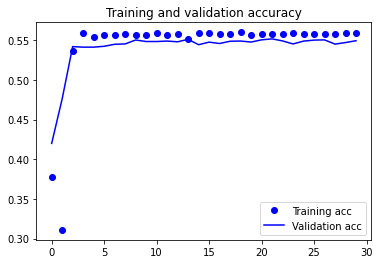

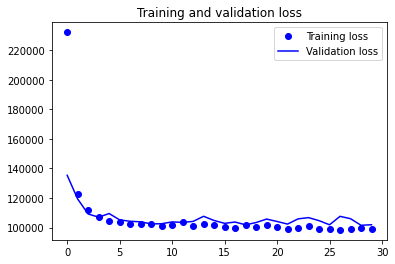

In [ ]:
import matplotlib.pyplot as plt

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()